### HOMEWORK 3
For this homework you are going to implement the unsharp masking filter (USM). It is a technique to improve the sharpness of an image by combining the image with its blurred (unsharp) version. See the Wikipedia page for more details.

Unsharp Masking (USP)
The USM technique consists of the following steps:

Load the image you will be working with.
Create a blurred (unsharp) version of the original image.
Add the unsharp image (with a certain weight) to the original.
To sum it up, the USM performs the following operation:

sharpened = original + (original − unsharp) × amount

Even though we provide you an image to work with, you are welcome to use your own images :-)

In [3]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]

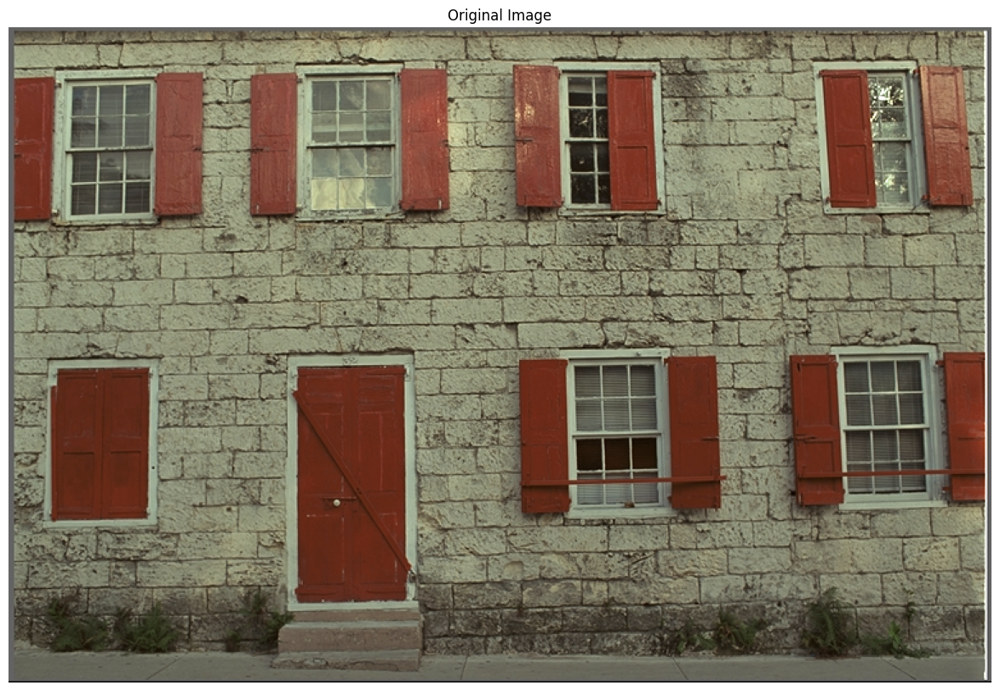

In [4]:
# Загружаем изображение
img = cv2.imread('kodim01.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')
plt.show()

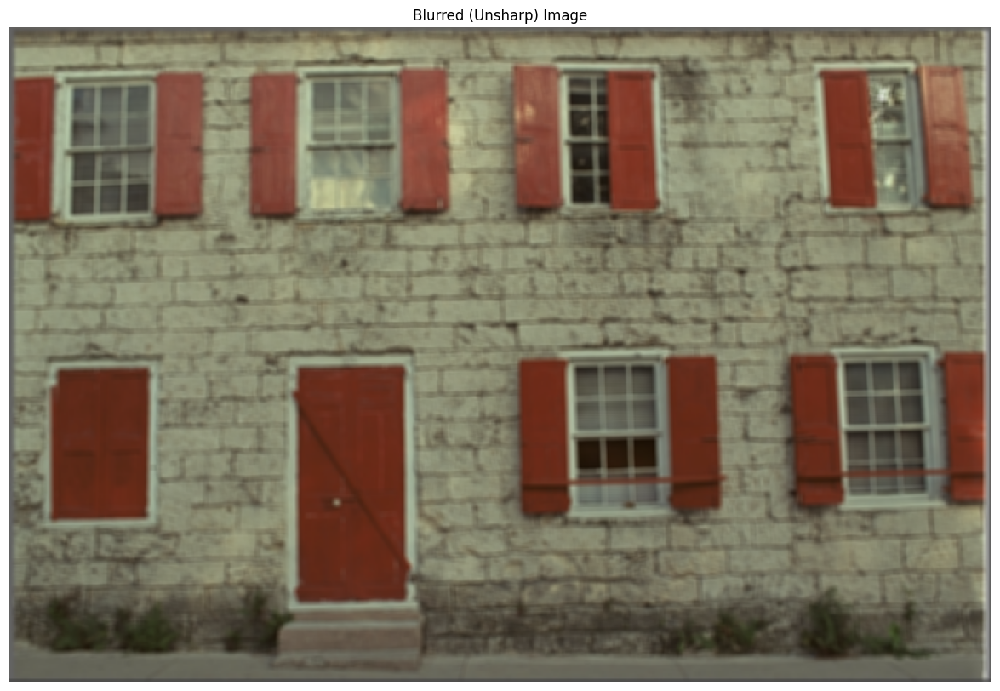

In [5]:
# Создаем размытую (unsharp) версию исходного изображения с помощью гауссова размытия
# Можно поэкспериментировать с разными размерами ядра (ksize) и значениями sigma
# Чем больше значения, тем сильнее размытие
unsharp = cv2.GaussianBlur(img, ksize=(5, 5), sigmaX=5)

# Показываем размытое изображение
plt.imshow(unsharp)
plt.title('Blurred (Unsharp) Image')
plt.axis('off')
plt.show()

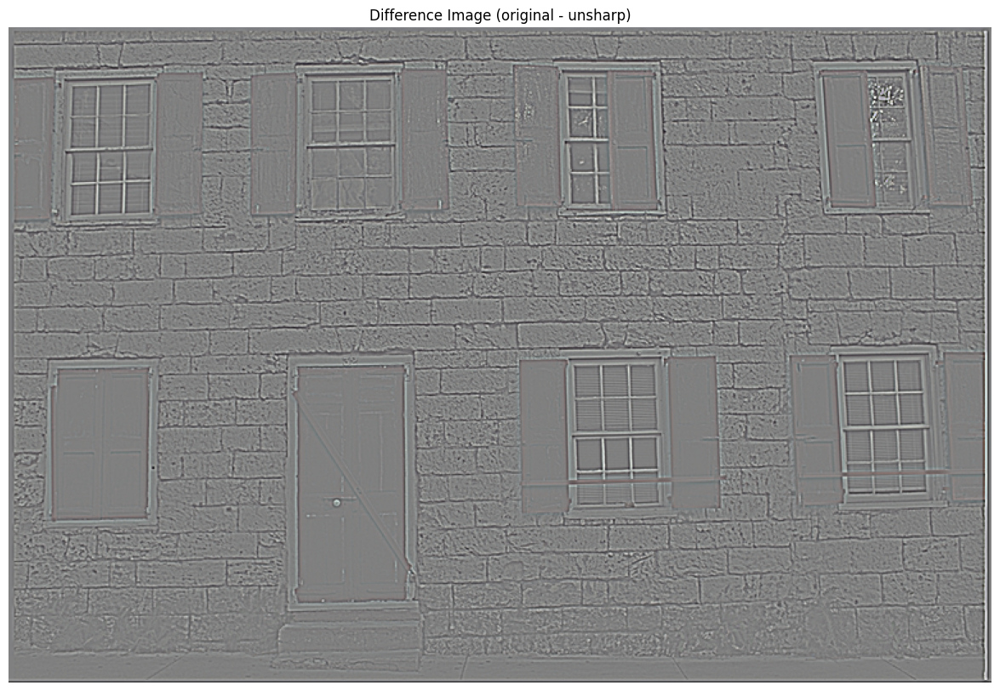

In [6]:
# Создаем изображение разницы (original - unsharp)
# Переводим в float, чтобы избежать underflow/overflow с uint8
img_float = img.astype(np.float32)
unsharp_float = unsharp.astype(np.float32)

diff = img_float - unsharp_float

# Визуализируем разницу (масштабируем для наглядности)
# Добавляем 128, чтобы центрировать значения для отображения
diff_display = np.clip(diff + 128, 0, 255).astype(np.uint8)
plt.imshow(diff_display)
plt.title('Difference Image (original - unsharp)')
plt.axis('off')
plt.show()

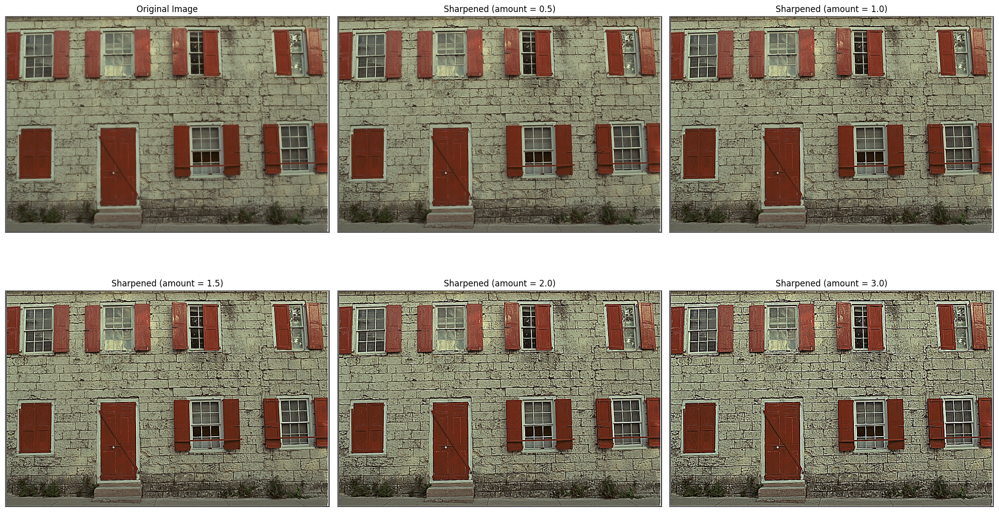

In [7]:
# Применяем USM и получаем итоговое изображение: sharpened = original + (original - unsharp) * amount
# Задаем разные значения amount для проверки
amounts = [0.5, 1.0, 1.5, 2.0, 3.0]

plt.figure(figsize=(20, 12))

# Показываем исходное изображение
plt.subplot(2, 3, 1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

# Тестируем разные значения amount
for i, amount in enumerate(amounts, start=2):
    # Применяем формулу USM
    sharpened = img_float + (diff * amount)
    
    # Ограничиваем значения диапазоном [0, 255] и переводим обратно в uint8
    sharpened = np.clip(sharpened, 0, 255).astype(np.uint8)
    
    # Отображаем результат
    plt.subplot(2, 3, i)
    plt.imshow(sharpened)
    plt.title(f'Sharpened (amount = {amount})')
    plt.axis('off')

plt.tight_layout()
plt.show()

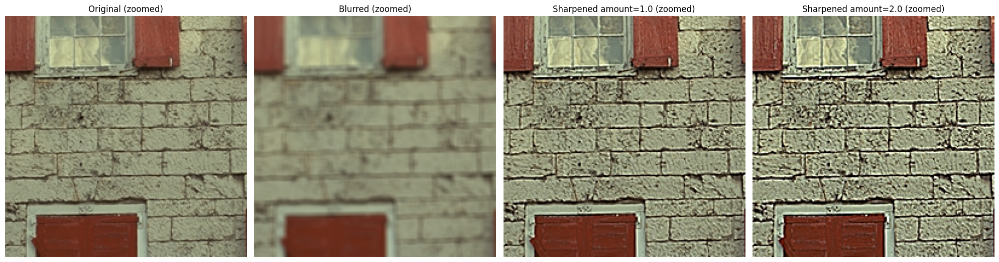

In [8]:
# Дополнительно сравним увеличенный фрагмент, чтобы лучше увидеть эффект резкости
# Выбираем область интереса (ROI)
y_start, y_end = 100, 300
x_start, x_end = 200, 400

plt.figure(figsize=(20, 8))

# ROI исходного изображения
plt.subplot(1, 4, 1)
plt.imshow(img[y_start:y_end, x_start:x_end])
plt.title('Original (zoomed)')
plt.axis('off')

# Размытый ROI
plt.subplot(1, 4, 2)
plt.imshow(unsharp[y_start:y_end, x_start:x_end])
plt.title('Blurred (zoomed)')
plt.axis('off')

# ROI после повышения резкости при amount=1.0
sharpened_1 = np.clip(img_float + diff * 1.0, 0, 255).astype(np.uint8)
plt.subplot(1, 4, 3)
plt.imshow(sharpened_1[y_start:y_end, x_start:x_end])
plt.title('Sharpened amount=1.0 (zoomed)')
plt.axis('off')

# ROI после повышения резкости при amount=2.0
sharpened_2 = np.clip(img_float + diff * 2.0, 0, 255).astype(np.uint8)
plt.subplot(1, 4, 4)
plt.imshow(sharpened_2[y_start:y_end, x_start:x_end])
plt.title('Sharpened amount=2.0 (zoomed)')
plt.axis('off')

plt.tight_layout()
plt.show()

### Вопросы - Ответы

#### Какое значение amount лучше ставить?

Я обычно беру amount в диапазоне от 0.5 до 2.0. Чаще всего начинаю с 1.0, потому что это дает аккуратную резкость без лишних артефактов. Дальше уже смотрю по самому изображению: если кадр немного мыльный, могу поднять значение ближе к 1.5 или 2.0, а если фото и так четкое, оставляю помягче.

#### Что будет, если значение слишком маленькое?

Если amount слишком маленький, например меньше 0.3, визуально почти ничего не меняется. Картинка выглядит почти так же, как исходная, детали остаются мягкими, а разница с оригиналом минимальная. Если поставить amount равным нулю, резкость вообще не добавляется.

#### Что будет, если значение слишком большое?

Если amount сделать слишком большим, например выше 3.0, начинается перешарп. На границах появляются ореолы, шум становится заметнее, а изображение начинает выглядеть неестественно. Иногда еще возникает клиппинг, когда значения выходят за диапазон 0-255, и в таких местах цвета могут смотреться странно или слишком насыщенно.